# Obligatorio - Taller de Deep Learning

**Fecha de entrega:** 10/12/2024  
**Puntaje máximo:** 50 puntos  

## Obligatorio

El objetivo de este obligatorio es evaluar su conocimiento en Deep Learning mediante la implementación completa de un modelo de segmentación de imágenes basado en el paper [**"U-Net: Convolutional Networks for Biomedical Image Segmentation"**](https://arxiv.org/pdf/1505.04597). Toda la implementación debe realizarse desde cero utilizando PyTorch, y los estudiantes tendrán la libertad de ajustar ciertos hiperparámetros y configuraciones mientras mantengan la esencia del paper original.

### **Competencia en Kaggle**

Además, como parte de este obligatorio, participarán en una competencia privada en Kaggle donde se les proporcionará un dataset de test oculto (sin target). Deberán subir sus predicciones a Kaggle y se evaluarán en función de la métrica **Dice Coefficient (Coeficiente de Dice)**. Esta competencia les permitirá comparar sus resultados con los de sus compañeros en un entorno real de evaluación.

### **Qué es el Dice Coefficient?**
El **Dice Coefficient**, también conocido como F1-score para segmentación, es una métrica utilizada para evaluar la similitud entre la predicción y la verdad del terreno en tareas de segmentación. Se define de la siguiente manera:

$$
\text{Dice} = \frac{2 \cdot |A \cap B|}{|A| + |B|}
$$

Donde:
- \(A\) es el conjunto de píxeles predichos como pertenecientes a la clase positiva.
- \(B\) es el conjunto de píxeles verdaderos pertenecientes a la clase positiva.
- \(|A \cap B|\) es la intersección de \(A\) y \(B\), es decir, los píxeles correctamente predichos como positivos.

Un valor de Dice de **1** indica una predicción perfecta, mientras que un valor de **0** indica que no hay coincidencia entre la predicción y el valor verdadero. Durante la competencia de Kaggle, deberán obtener un puntaje de al menos **0.7** en la métrica Dice para considerarse aprobados.

### **Criterios a Evaluar**

1. **Implementación Correcta del Modelo U-Net (20 puntos):**
   - Construcción de la arquitectura U-Net siguiendo la estructura descrita en el paper, permitiendo ajustes como el número de filtros, funciones de activación y métodos de inicialización de pesos.
   - Se aceptan mejoras como el uso de técnicas adicionales como batch normalization, otras funciones de activación, etc.

2. **Entrenamiento del Modelo (10 puntos):**
   - Configuración adecuada del ciclo de entrenamiento, incluyendo la elección de la función de pérdida y del optimizador (Adam, SGD, etc.).
   - Uso de técnicas de regularización para mejorar la generalización del modelo, como el dropout, normalización de batch y data augmentation.
   - Gráficas y análisis de la evolución del entrenamiento, mostrando las curvas de pérdida y métricas relevantes tanto en el conjunto de entrenamiento como en el de validación.

3. **Evaluación de Resultados (10 puntos):**
   - Evaluación exhaustiva del modelo utilizando métricas de segmentación como **Dice Coefficient**.
   - Análisis detallado de los resultados, incluyendo un análisis de errores para identificar y discutir casos difíciles.
   - Visualización de ejemplos representativos de segmentaciones correctas e incorrectas, comparando con las etiquetas manuales proporcionadas en el dataset.

4. **Participación y Resultados en la Competencia Kaggle (5 puntos):**
   - Participación activa en la competencia de Kaggle, con al menos una (1) subida de predicción.
   - Puntaje obtenido en la tabla de posiciones de Kaggle, evaluado en base al **Dice Coefficient** en el conjunto de test oculto. Es necesario obtener al menos un valor de **0.7** para esta métrica.

   Nota: El **Dice Coefficient** es la métrica utilizada para evaluar la precisión de los modelos de segmentación de imágenes en esta competencia. Un valor de Dice superior a 0.7 es requerido para aprobar esta tarea.

### **Run-Length Encoding (RLE)**

Dado que no se suben las imágenes segmentadas directamente a Kaggle, se requiere usar **Run-Length Encoding (RLE)** para comprimir las máscaras de predicción en una cadena de texto que será evaluada. El **RLE** es una técnica de compresión donde se representan secuencias consecutivas de píxeles en formato `start length`, indicando la posición de inicio y la longitud de cada secuencia de píxeles positivos.

Para calcular el **RLE**, se sigue el siguiente proceso:

1. Se aplanan las máscaras predichas en un solo vector
2. Se identifican los píxeles con valor positivo (1) y se calculan las secuencias consecutivas.
3. Se registra la posición de inicio de cada secuencia y su longitud en formato `start length`.

Este formato comprimido se sube a Kaggle en lugar de las imágenes segmentadas.

#### **Ejemplo de RLE**

```python
import numpy as np

def rle_encode(mask):
    pixels = np.array(mask).flatten(order='F')  # Aplanar la máscara en orden Fortran
    pixels = np.concatenate([[0], pixels, [0]])  # Añadir ceros al principio y final
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1  # Encontrar transiciones
    runs[1::2] = runs[1::2] - runs[::2]  # Calcular longitudes
    return ' '.join(str(x) for x in runs)

mask = np.array([[0, 0, 1, 0, 0],
                 [0, 1, 1, 1, 0],
                 [1, 1, 1, 0, 0],
                 [0, 0, 0, 1, 1]])

print(rle_encode(mask))
```

> **Salida:** 3 1 6 2 9 3 14 1 16 1 20 1


### **Sobre el Dataset**

El dataset proporcionado para esta tarea incluirá imágenes y máscaras para la segmentación de un conjunto específico de clases. El conjunto de entrenamiento estará disponible para su uso durante todo el proceso de desarrollo y pruebas, mientras que el conjunto de validación se mantendrá oculto para la evaluación final en Kaggle.

### **Instrucciones de Entrega**

- Deberán entregar un Jupyter Notebook (.ipynb) que contenga todo el código y las explicaciones necesarias para ejecutar la implementación, el entrenamiento y la evaluación del modelo.
- El notebook debe incluir secciones bien documentadas explicando las decisiones de diseño del modelo, los experimentos realizados, y los resultados obtenidos.
- El código debe estar escrito de manera clara.
- La entrega debe realizarse a través de la plataforma de gestión de ORT (gestion.ort.edu.uy) antes de la fecha límite.

### **Materiales Adicionales**

Para facilitar su trabajo, pueden consultar los siguientes recursos:

- [U-Net: Convolutional Networks for Biomedical Image Segmentation (paper original)](https://arxiv.org/abs/1505.04597)
- [Documentación de PyTorch](https://pytorch.org/docs/stable/index.html)
- [Tutoriales y recursos adicionales en Kaggle](https://www.kaggle.com/)

### **Competencia Kaggle**

https://www.kaggle.com/t/9b4e546084034a59b182aac1ae892640

# Descargo datos

In [2]:
!pip install kaggle

In [3]:
!mkdir ~/.kaggle

In [12]:
!kaggle competitions download -c tdl-segmentacion

 99%|██████████████████████████████████████▊| 2.13G/2.14G [00:16<00:00, 171MB/s]
100%|███████████████████████████████████████| 2.14G/2.14G [00:16<00:00, 142MB/s]


In [2]:
!ls

best_model.pth	       submission_v5_combined_loss.csv
segmentation-dataset   tdl-segmentacion.zip
submission.csv	       unet_v1.pth
submission_v2.csv      unet_v2_reg.pth
submission_v3_reg.csv  unet_v3_lr.pth
submission_v4_reg.csv  unet_v4_combined_loss.pth


In [4]:
!unzip -q tdl-segmentacion.zip -d ./segmentation-dataset

replace ./segmentation-dataset/test/images/1024.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [6]:
!ls ./segmentation-dataset

test  train


In [7]:
!ls ./segmentation-dataset/test

images


In [8]:
!ls ./segmentation-dataset/train

images	masks


# Imports y Utils

In [1]:
kaggle_json = {"username":"fernandowajl","key":"XXXXXXXXX"}

import os

os.environ['KAGGLE_USERNAME'] = kaggle_json['username']
os.environ['KAGGLE_KEY'] = kaggle_json['key']

In [2]:
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np
import random
import kaggle
from torchvision import transforms
from torch.utils.data import Dataset
import numpy as np
import torch
from torch.utils.data import DataLoader

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import time


## Commons

In [3]:
def train(
    model,
    optimizer,
    criterion,
    train_loader,
    val_loader,
    device,
    epochs=10,
    patience=5,
    log_every=1,
    save_weights=True,
    save_path="best_model.pth",
    log_fn=None,
    prev_bce_weight=0.75,
    adjust_loss_weights_fn=None,
    prev_best_val_loss= float("inf")
):
    epoch_train_errors = []
    epoch_val_errors = []
    best_val_loss = prev_best_val_loss
    early_stopping = EarlyStopping(patience=patience)

    if log_fn is None:
        log_fn = print

    start_time = time.time()

    for epoch in range(epochs):
        if adjust_loss_weights_fn is not None:
            bce_weight, dice_weight = adjust_loss_weights_fn(prev_bce_weight)
            criterion.update_weights(bce_weight, dice_weight)
            prev_bce_weight = bce_weight

        model.train()
        train_loss = 0

        for x, y in train_loader:
            x, y = x.to(device), y.to(device)

            optimizer.zero_grad()
            output = model(x)
            loss = criterion(output, y)

            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        train_loss /= len(train_loader)
        epoch_train_errors.append(train_loss)

        val_loss = evaluate(model, criterion, val_loader, device)
        epoch_val_errors.append(val_loss)

        if (epoch + 1) % log_every == 0:
            log_fn(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.8f}, Val Loss: {val_loss:.8f}")

            if adjust_loss_weights_fn is not None:
                log_fn(f"Pesos de la pérdida (BCE: {bce_weight:.4f}, Dice: {dice_weight:.4f})")

        if save_weights and val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), save_path)
            log_fn(f"Pesos guardados en {save_path} con val_loss de {val_loss:.8f}")

        early_stopping(val_loss)
        if early_stopping.early_stop:
            log_fn(f"Early stopping en la época {epoch+1}. Mejor val_loss: {early_stopping.best_score:.8f}")
            break

    end_time = time.time()    
    total_secs = end_time - start_time
    total_minutes = total_secs / 60
    total_hours = total_minutes / 60
    
    if total_minutes < 60:
        unit_time = 'minutos'
        total_time = total_minutes
    else:
        unit_time = 'horas'
        total_time = total_hours

    log_fn(f"El entrenamiento completo demoró {total_time:.2f} {unit_time}.")

    return epoch_train_errors, epoch_val_errors

In [4]:
class EarlyStopping:
    def __init__(self, patience=5):
        self.patience = patience
        self.counter = 0
        self.best_score = float("inf")
        self.early_stop = False

    def __call__(self, val_loss):
        if val_loss >= self.best_score:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = val_loss
            self.counter = 0

def plot_taining(train_errors, val_errors):
    plt.figure(figsize=(10, 5))
    plt.plot(train_errors, label="Train Loss")
    plt.plot(val_errors, label="Validation Loss")
    plt.title("Training and Validation Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

def rle_encode(mask):
    pixels = np.array(mask).flatten(order='F')  # Aplanar la máscara en orden Fortran
    pixels = np.concatenate([[0], pixels, [0]])  # Añadir ceros al principio y final
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1  # Encontrar transiciones
    runs[1::2] = runs[1::2] - runs[::2]  # Calcular longitudes
    return ' '.join(str(x) for x in runs)

In [5]:
def evaluate(model, criterion, data_loader, device):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for x, y in data_loader:
            x = x.to(device)
            y = y.to(device)
            output = model(x)
            total_loss += criterion(output, y).item()
    return total_loss / len(data_loader)

## generate_kaggle_submission
Funcion que devuelve el archivo para subir a kaggle

In [6]:
def generate_kaggle_submission(model, test_loader, test_dataset, device, output_file='submission.csv'):
    model.eval()
    results = []
    
    image_filenames = test_dataset.image_files

    with torch.no_grad():
        for idx, x in enumerate(test_loader):
            x = x.to(device)
            output = model(x)
            output = (output > 0.5).float()
            output = output.cpu().numpy()

            for mask in output:
                mask = mask.squeeze(0)  
                rle = rle_encode(mask)
                results.append((image_filenames[idx], rle))

    with open(output_file, 'w') as f:
        f.write("id,encoded_pixels\n")
        for filename, rle in results:
            f.write(f"{filename},{rle}\n")

    print(f"Archivo de predicciones guardado como {output_file}")

## evaluate_and_show_test
Funcion que para el dataset de test muestra la imagen original y la mascara que devuelve el modelo

In [7]:
def evaluate_and_show_test(model, test_loader, device, index=0):
    model.eval()
    with torch.no_grad():
        data = list(test_loader)
        
        if index >= len(data):
            print(f"El índice {index} está fuera de rango. El máximo índice es {len(data) - 1}.")
            return
        
        x = data[index]
        
        if isinstance(x, (list, tuple)):
            x = x[0]
        
        x = x.to(device)
        output = model(x)
        output = (output > 0.5).float()
        output = output.cpu().numpy()

        mask_array = np.squeeze(output[0], axis=0)
        mask_array = mask_array * 255

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(x.cpu().squeeze().permute(1, 2, 0))
        plt.title(f'Input (Imagen {index})')

        plt.subplot(1, 2, 2)
        plt.imshow(mask_array, cmap='gray', vmin=0, vmax=255)
        plt.title('Prediction')
        plt.show()

## calculate_dice_score
Funcion que calcula el dice coefficient promedio en todo el conjunto de validacion.

In [49]:
def calculate_dice_score(output, target, smooth=1e-6):
    output_flat = output.view(-1)
    target_flat = target.view(-1)

    intersection = (output_flat * target_flat).sum()
    dice = (2. * intersection + smooth) / (output_flat.sum() + target_flat.sum() + smooth)

    return dice.item()

def calculate_loader_dice_score(model, val_loader, device):
    model.eval()
    dice_score_total = 0.0

    with torch.no_grad():
        for x, y in val_loader:
            x, y = x.to(device), y.to(device)

            output = model(x)
            output = (output > 0.5).float() 

            dice = dice_score(output, y)
            dice_score_total += dice

    return dice_score_total / len(val_loader)


In [9]:
def dice_loss_fn(preds, targets, smooth=1):
    preds = preds.contiguous()
    targets = targets.contiguous()
    
    preds_flat = preds.view(-1)
    targets_flat = targets.view(-1)
    
    intersection = (preds_flat * targets_flat).sum()
    
    dice = (2. * intersection + smooth) / (preds_flat.sum() + targets_flat.sum() + smooth)
    return 1 - dice

## show_val_predictions
Funcion que muestra la imagen de entrada, la predicción del modelo y la mascara correcta.

In [10]:
def show_val_predictions(model, val_loader, device, index=0):
    model.eval()
    with torch.no_grad():
        data = list(val_loader)
        
        if index >= len(data):
            print(f"El índice {index} está fuera de rango. El máximo índice es {len(data) - 1}.")
            return
        
        x, y = data[index]
        x, y = x.to(device), y.to(device)
        
        output = model(x)
        output = (output > 0.5).float()
        output = output.cpu().numpy()
        y = y.cpu().numpy()

        mask_pred = np.squeeze(output[0], axis=0) * 255
        mask_true = np.squeeze(y[0], axis=0) * 255

        plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 3, 1)
        plt.imshow(x.cpu().squeeze().permute(1, 2, 0))
        plt.title(f'Input (Imagen {index})')

        plt.subplot(1, 3, 2)
        plt.imshow(mask_pred, cmap='gray', vmin=0, vmax=255)
        plt.title('Prediction')

        plt.subplot(1, 3, 3)
        plt.imshow(mask_true, cmap='gray', vmin=0, vmax=255)
        plt.title('Correct Mask')

        plt.show()

## find_best_and_worst_predictions
Para ver donde el modelo anda bien y donde le esta errando implemento funcion que calcula el dice para todos, imprime el proemdio y ademas muestra las mejores y las peores.

In [50]:
def find_best_and_worst_predictions(model, val_loader, device, num_images=3):
    model.eval()
    dice_scores = []
    images = []

    with torch.no_grad():
        for x, y in val_loader:
            x, y = x.to(device), y.to(device)

            output = model(x)
            output = (output > 0.5).float()

            dice_value = calculate_dice_score(output, y)
            dice_scores.append(dice_value)
            images.append((x.cpu(), output.cpu(), y.cpu()))

    sorted_indices = sorted(range(len(dice_scores)), key=lambda k: dice_scores[k])

    print(f"Peores {num_images} predicciones:")
    for i in sorted_indices[:num_images]:
        x, output, y = images[i]
        show_single_prediction(x, output, y, dice_scores[i], title='Worst')

    print(f"Mejores {num_images} predicciones:")
    for i in sorted_indices[-num_images:]:
        x, output, y = images[i]
        show_single_prediction(x, output, y, dice_scores[i], title='Best')

    average_dice = sum(dice_scores) / len(dice_scores)
    print(f"Promedio de Dice en el conjunto de validación: {average_dice:.8f}")

    return average_dice

## Global variables

In [12]:
# definimos el dispositivo que vamos a usar
DEVICE = "cpu"  # por defecto, usamos la CPU
if torch.cuda.is_available():
    DEVICE = "cuda"  # si hay GPU, usamos la GPU
elif torch.backends.mps.is_available():
    DEVICE = "mps"  # si no hay GPU, pero hay MPS, usamos MPS

NUM_WORKERS = max(os.cpu_count() - 1, 1)  # número de workers para cargar los datos
NUM_CLASES = 10

print(f"Device: {DEVICE}")
print(f"Num Workers: {NUM_WORKERS}")

Device: cuda
Num Workers: 3


In [13]:
train_images_path = './segmentation-dataset/train/images'
train_masks_path = './segmentation-dataset/train/masks'

test_images_path = './segmentation-dataset/test/images'

base_path_kaggle = '/kaggle/working/'

# Analisis del dataset

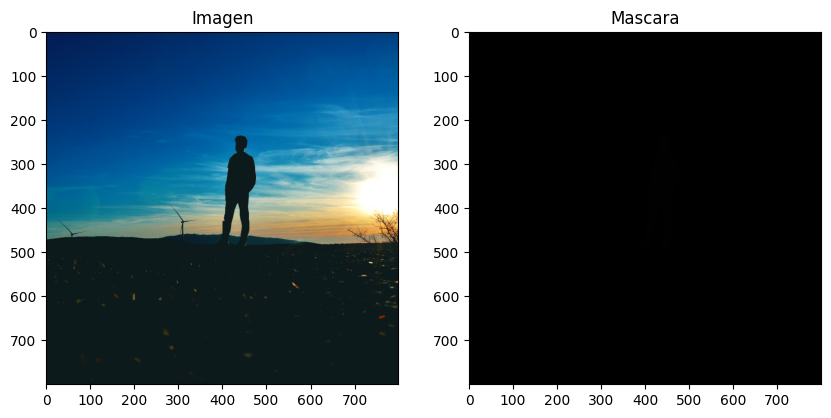

In [13]:
train_images = sorted(os.listdir(train_images_path))
train_masks = sorted(os.listdir(train_masks_path))

image_path = os.path.join(train_images_path, train_images[0])
mask_path = os.path.join(train_masks_path, train_masks[0])

image = Image.open(image_path)
mask = Image.open(mask_path)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Imagen')

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap='gray')
plt.title('Mascara')

plt.show()

Probablemente la mascara necesite alguna transformacion para poder visualizarla correctamente

In [17]:
mask_array = np.array(mask)

print("Valores unicos en la mascara:", np.unique(mask_array))

Valores unicos en la mascara: [0 1]


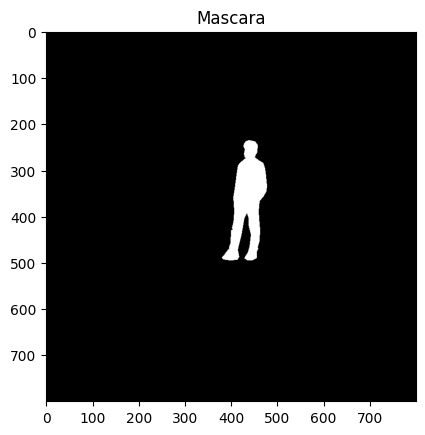

In [18]:
mask_array = mask_array * 255


plt.imshow(mask_array, cmap='gray', vmin=0, vmax=255)
plt.title('Mascara')
plt.show()

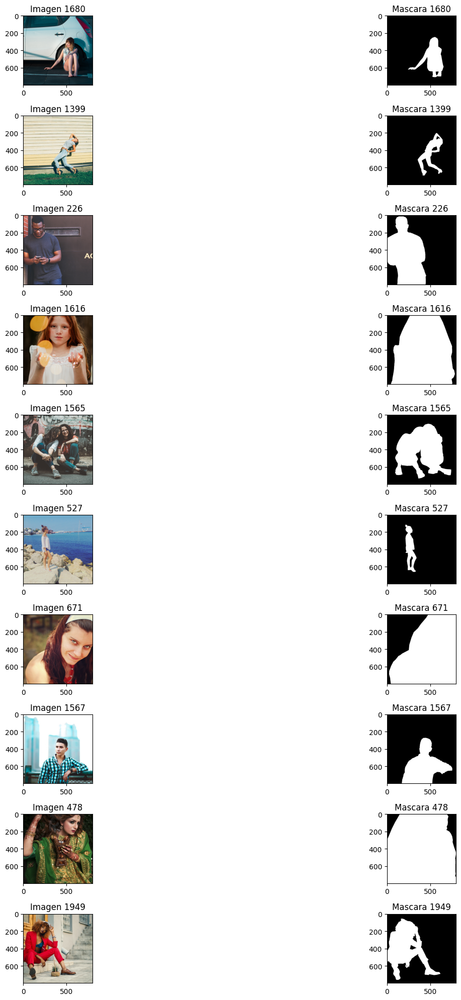

In [20]:
train_images = os.listdir(train_images_path)
train_masks = os.listdir(train_masks_path)

random_indices = random.sample(range(len(train_images)), 10)


plt.figure(figsize=(20, 20))

for i, idx in enumerate(random_indices):

    image_path = os.path.join(train_images_path, train_images[idx])
    mask_path = os.path.join(train_masks_path, train_masks[idx])

    image = Image.open(image_path)
    mask = Image.open(mask_path)

    mask_array = np.array(mask) * 255

    plt.subplot(10, 2, 2*i+1)
    plt.imshow(image)
    plt.title(f'Imagen {idx+1}')

    plt.subplot(10, 2, 2*i+2)
    plt.imshow(mask_array, cmap='gray', vmin=0, vmax=255)
    plt.title(f'Mascara {idx+1}')

plt.tight_layout()
plt.show()

In [22]:
image_sizes = []
mask_sizes = []

for image_file, mask_file in zip(train_images, train_masks):
    image_path = os.path.join(train_images_path, image_file)
    mask_path = os.path.join(train_masks_path, mask_file)

    image = Image.open(image_path)
    mask = Image.open(mask_path)

    image_sizes.append(image.size)
    mask_sizes.append(mask.size)

unique_image_sizes = set(image_sizes)
unique_mask_sizes = set(mask_sizes)

In [23]:
print("Tamaños unicos de las imagenes:", unique_image_sizes)
print("Tamaños unicos de las mascaras:", unique_mask_sizes)

Tamaños unicos de las imagenes: {(800, 800)}

Tamaños unicos de las mascaras: {(800, 800)}


In [26]:
is_binary = True

for mask_file in train_masks:
    mask_path = os.path.join(train_masks_path, mask_file)
    mask = np.array(Image.open(mask_path))

    unique_values = np.unique(mask)

    if not (np.array_equal(unique_values, [0, 1]) or np.array_equal(unique_values, [0]) or np.array_equal(unique_values, [1])):
        is_binary = False
        print(f"Mascara {mask_file} tiene valores: {unique_values}")

if is_binary:
    print("Todas las mascaras son binarias.")
else:
    print("Hay mascaras que no son binarias.")

Todas las mascaras son binarias.


In [28]:
image_path = os.path.join(train_images_path, train_images[0])
image = Image.open(image_path)

print(f"{image.mode}")

RGB


# Dataset

In [14]:
class SegmentationDataset(Dataset):
    def __init__(self, images_dir, masks_dir, transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.transform = transform
        self.image_files = os.listdir(images_dir)
        self.mask_files = os.listdir(masks_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.images_dir, self.image_files[idx])
        mask_path = os.path.join(self.masks_dir, self.mask_files[idx])

        image = Image.open(image_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')


        mask = np.array(mask, dtype=np.float32)


        if self.transform:
            image = self.transform(image)


        mask = np.expand_dims(mask, axis=0)

        return image, mask

In [15]:
dataset = SegmentationDataset(train_images_path, train_masks_path, transform=transforms.ToTensor())
loader = DataLoader(dataset, batch_size=64, shuffle=False)

mean = 0.
std = 0.
total_images = 0

for images, _ in loader:
    batch_samples = images.size(0)  
    images = images.view(batch_samples, images.size(1), -1)  
    mean += images.mean(2).sum(0) 
    std += images.std(2).sum(0) 
    total_images += batch_samples

mean /= total_images
std /= total_images

print(f"Mean: {mean}")
print(f"Std: {std}")

Mean: tensor([0.5150, 0.4840, 0.4597])
Std: tensor([0.2425, 0.2374, 0.2351])


In [16]:
mean, std

(tensor([0.5150, 0.4840, 0.4597]), tensor([0.2425, 0.2374, 0.2351]))

In [17]:
image_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

In [18]:
train_dataset = SegmentationDataset(train_images_path, train_masks_path, transform=image_transforms)


train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

In [19]:
print(f'Train size: {train_size}')
print(f'Val size: {val_size}')

Train size: 1706
Val size: 427


In [20]:
class TestDataset(Dataset):
    def __init__(self, images_dir, transform=None):
        self.images_dir = images_dir
        self.transform = transform
        self.image_files = os.listdir(images_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.images_dir, self.image_files[idx])
        image = Image.open(image_path)

        if self.transform:
            image = self.transform(image)

        return image

In [21]:
test_dataset = TestDataset(images_dir=test_images_path, transform=image_transforms)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [22]:
print(f"Tamaño del conjunto de test: {len(test_dataset)}")

Tamaño del conjunto de test: 534


In [23]:
batch_size = 1

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

print(f'Batch size: {batch_size}')

Batch size: 1


# Train

In [22]:
class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()

        self.encoder1 = self._block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = self._block(64, 128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = self._block(128, 256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = self._block(256, 512)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = self._block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = self._block(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = self._block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = self._block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = self._block(128, 64)

        self.conv = nn.Conv2d(64, out_channels, kernel_size=1)

    @staticmethod
    def _block(in_channels, features):
        return nn.Sequential(
            nn.Conv2d(in_channels, features, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(features, features, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)

        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)

        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)

        return torch.sigmoid(self.conv(dec1))

In [ ]:
model = UNet(in_channels=3, out_channels=1).to(DEVICE)

In [24]:
optimizer = optim.Adam(model.parameters(), lr=0.001)
bce_loss = nn.BCELoss()

In [25]:
base_path_kaggle = '/kaggle/working/'

In [26]:
model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v1.pth"))

/tmp/ipykernel_30/834037643.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v1.pth"))


<All keys matched successfully>

In [27]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=bce_loss,
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=10,
    patience=5,
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_v1.pth"
)

Epoch 1/10, Train Loss: 0.58860180, Val Loss: 0.56617609
Pesos guardados en /kaggle/working/unet_v1.pth con val_loss de 0.56617609
Epoch 2/10, Train Loss: 0.59654717, Val Loss: 0.56661845
Epoch 3/10, Train Loss: 0.57861099, Val Loss: 0.57873221
Epoch 4/10, Train Loss: 0.57438948, Val Loss: 0.56023186
Pesos guardados en /kaggle/working/unet_v1.pth con val_loss de 0.56023186
Epoch 5/10, Train Loss: 0.57310330, Val Loss: 0.59348373
Epoch 6/10, Train Loss: 0.56824835, Val Loss: 0.56262284
Epoch 7/10, Train Loss: 0.56532499, Val Loss: 0.56400272
Epoch 8/10, Train Loss: 0.56233610, Val Loss: 0.54218368
Pesos guardados en /kaggle/working/unet_v1.pth con val_loss de 0.54218368
Epoch 9/10, Train Loss: 0.55934888, Val Loss: 0.54304821
Epoch 10/10, Train Loss: 0.56026105, Val Loss: 0.55196461
El entrenamiento completo demoró 9981.94 segundos.


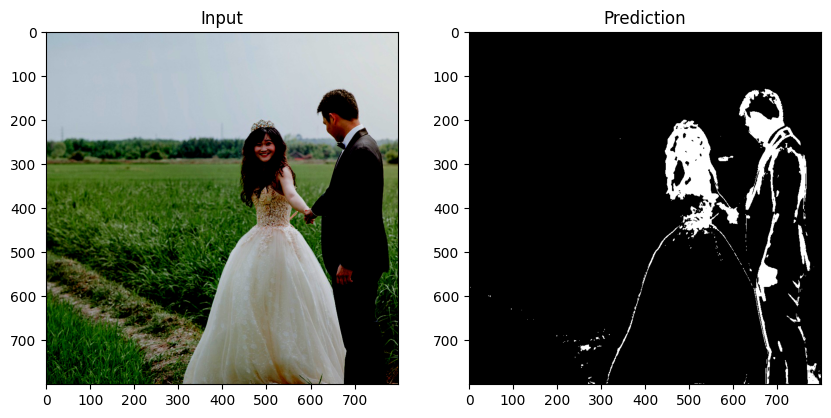

In [28]:
evaluate_and_show_test(model, test_loader, DEVICE)

In [34]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_v2.csv")

Archivo de predicciones guardado como /kaggle/working/submission_v2.csv


Dio 0.518 en kaggle

## UNetDropout

Agrego
- Dropout: para evitar el sobreajuste eliminando aleatoriamente algunas conexiones durante el entrenamiento.
- Weight decay: para penalizar los pesos grandes y mejorar la generalización

In [24]:
class UNetDropout(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, dropout_prob=0.5):
        super(UNetDropout, self).__init__()
        self.dropout_prob = dropout_prob 
        
        self.encoder1 = self._block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = self._block(64, 128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = self._block(128, 256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = self._block(256, 512)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = self._block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = self._block(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = self._block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = self._block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = self._block(128, 64)

        self.conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def _block(self, in_channels, features):
        return nn.Sequential(
            nn.Conv2d(in_channels, features, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout(self.dropout_prob), 
            nn.Conv2d(features, features, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout(self.dropout_prob)
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)

        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)

        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)

        return torch.sigmoid(self.conv(dec1))


In [19]:
model = UNetDropout(in_channels=3, out_channels=1, dropout_prob=0.3).to(DEVICE)

In [20]:
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)

bce_loss = nn.BCELoss()

In [21]:
base_path_kaggle = '/kaggle/working/'

In [24]:
# Solucion dada por chat gpt para cargar los pesos de la misma arqui agregando solo dropout
pretrained_dict = torch.load(f"{base_path_kaggle}unet_v1.pth")

model_dict = model.state_dict()

for old_key in list(pretrained_dict.keys()):
    new_key = old_key.replace('.2.', '.3.') 
    if new_key in model_dict:
        pretrained_dict[new_key] = pretrained_dict.pop(old_key)

pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}

model_dict.update(pretrained_dict)

model.load_state_dict(model_dict)

/tmp/ipykernel_30/1197521065.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pretrained_dict = torch.load(f"{base_path_kaggle}unet_v1.pth")


<All keys matched successfully>

In [25]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=bce_loss,
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=20,
    patience=5,
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_v2_reg.pth"
)

Epoch 1/20, Train Loss: 0.58690277, Val Loss: 0.55887258
Pesos guardados en /kaggle/working/unet_v2_reg.pth con val_loss de 0.55887258
Epoch 2/20, Train Loss: 0.58605931, Val Loss: 0.56842015
Epoch 3/20, Train Loss: 0.57730827, Val Loss: 0.54057073
Pesos guardados en /kaggle/working/unet_v2_reg.pth con val_loss de 0.54057073
Epoch 4/20, Train Loss: 0.57264190, Val Loss: 0.54817141
Epoch 5/20, Train Loss: 0.57146382, Val Loss: 0.53672042
Pesos guardados en /kaggle/working/unet_v2_reg.pth con val_loss de 0.53672042
Epoch 6/20, Train Loss: 0.57224677, Val Loss: 0.54130794
Epoch 7/20, Train Loss: 0.57411924, Val Loss: 0.54124105
Epoch 8/20, Train Loss: 0.57045458, Val Loss: 0.53566372
Pesos guardados en /kaggle/working/unet_v2_reg.pth con val_loss de 0.53566372
Epoch 9/20, Train Loss: 0.57069288, Val Loss: 0.58873135
Epoch 10/20, Train Loss: 0.57094538, Val Loss: 0.54745566
Epoch 11/20, Train Loss: 0.57345341, Val Loss: 0.53992173
Epoch 12/20, Train Loss: 0.56940798, Val Loss: 0.57485273
E

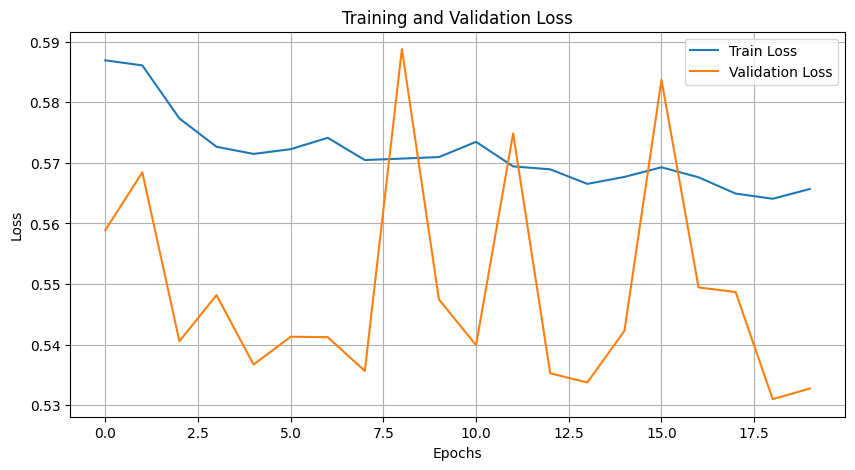

In [28]:
plot_taining(train_losses, val_losses)

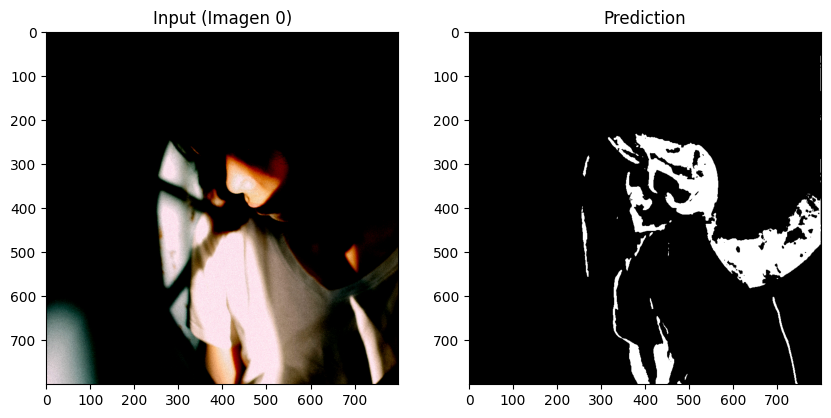

In [31]:
evaluate_and_show_test(model, test_loader, DEVICE, index=0)

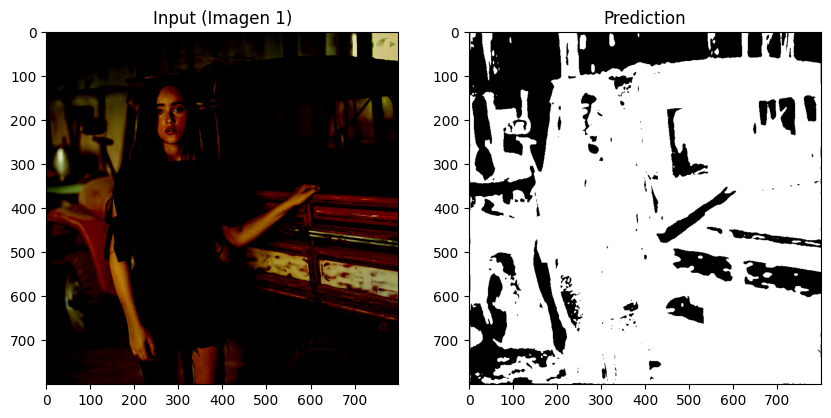

In [32]:
evaluate_and_show_test(model, test_loader, DEVICE, index=1)

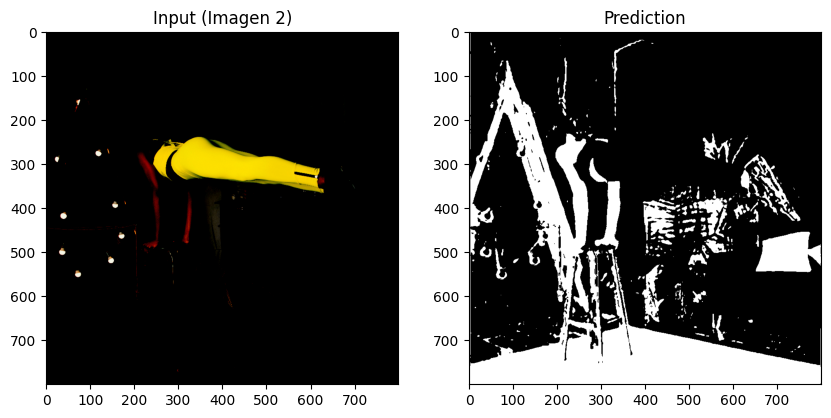

In [33]:
evaluate_and_show_test(model, test_loader, DEVICE, index=2)

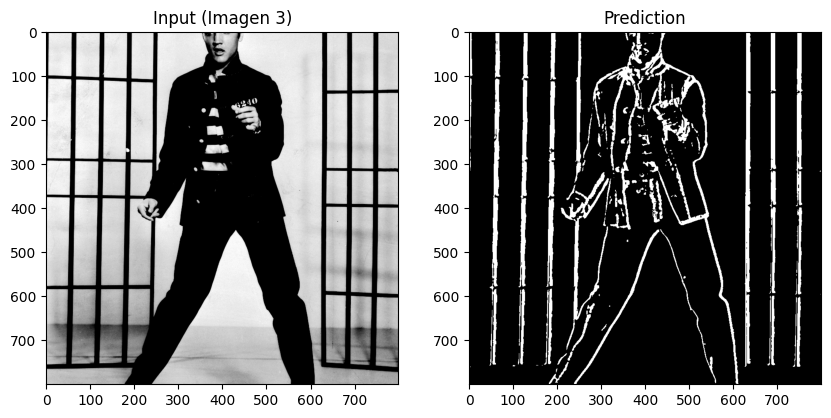

In [34]:
evaluate_and_show_test(model, test_loader, DEVICE, index=3)

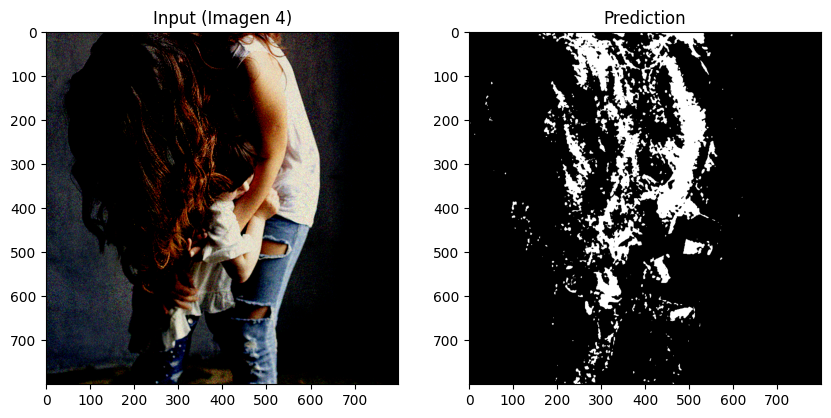

In [35]:
evaluate_and_show_test(model, test_loader, DEVICE, index=4)

In [27]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_v3_reg.csv")

Archivo de predicciones guardado como /kaggle/working/submission_v3_reg.csv


Dio 0.549 en kaggle

## Regularizacion v2

Bajo el learning rate, mucha subida y bajada en la val loss

In [15]:
model = UNetDropout(in_channels=3, out_channels=1, dropout_prob=0.3).to(DEVICE)

In [19]:
model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v2_reg.pth"))

/tmp/ipykernel_30/3392709767.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v2_reg.pth"))


<All keys matched successfully>

In [20]:
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

bce_loss = nn.BCELoss()

In [ ]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=bce_loss,
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=30,  
    patience=5, 
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_v3_lr.pth"
)
#0.53100407

Epoch 1/30, Train Loss: 0.53850299, Val Loss: 0.54200525
Pesos guardados en /kaggle/working/unet_v3_lr.pth con val_loss de 0.54200525
Epoch 2/30, Train Loss: 0.53552509, Val Loss: 0.54083027
Pesos guardados en /kaggle/working/unet_v3_lr.pth con val_loss de 0.54083027
Epoch 3/30, Train Loss: 0.53441271, Val Loss: 0.54107185
Epoch 4/30, Train Loss: 0.53344119, Val Loss: 0.54216888
Epoch 5/30, Train Loss: 0.53292720, Val Loss: 0.53962180
Pesos guardados en /kaggle/working/unet_v3_lr.pth con val_loss de 0.53962180
Epoch 6/30, Train Loss: 0.53229642, Val Loss: 0.53813969
Pesos guardados en /kaggle/working/unet_v3_lr.pth con val_loss de 0.53813969
Epoch 7/30, Train Loss: 0.53138357, Val Loss: 0.53726489
Pesos guardados en /kaggle/working/unet_v3_lr.pth con val_loss de 0.53726489
Epoch 8/30, Train Loss: 0.53126559, Val Loss: 0.53767726
Epoch 9/30, Train Loss: 0.53055422, Val Loss: 0.53677883
Pesos guardados en /kaggle/working/unet_v3_lr.pth con val_loss de 0.53677883
Epoch 10/30, Train Loss: 

In [16]:
model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v3_lr.pth"))

/tmp/ipykernel_30/2723276304.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v3_lr.pth"))


<All keys matched successfully>

In [ ]:
plot_taining(train_losses, val_losses)

In [17]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_v4_reg.csv")

Archivo de predicciones guardado como /kaggle/working/submission_v4_reg.csv


Dio 0.592 en kaggle

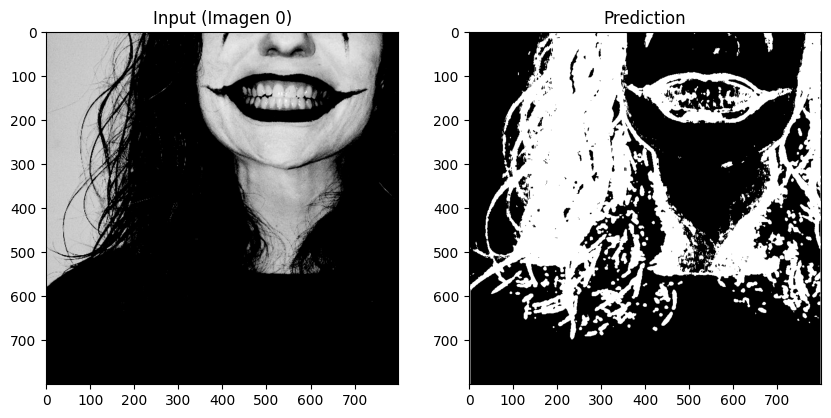

In [18]:
evaluate_and_show_test(model, test_loader, DEVICE, index=0)

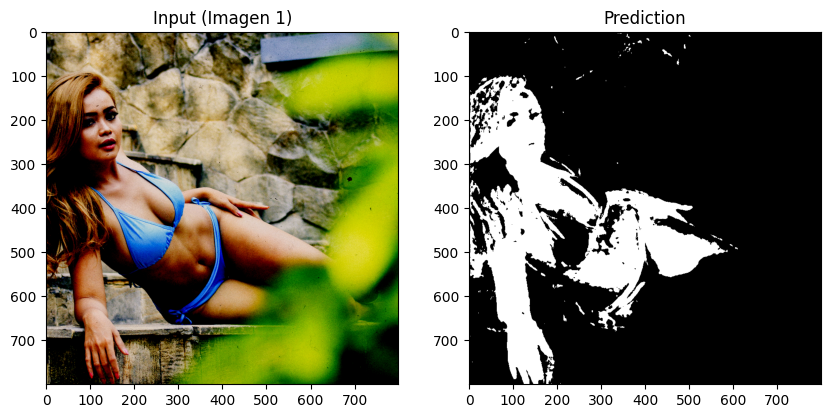

In [19]:
evaluate_and_show_test(model, test_loader, DEVICE, index=1)

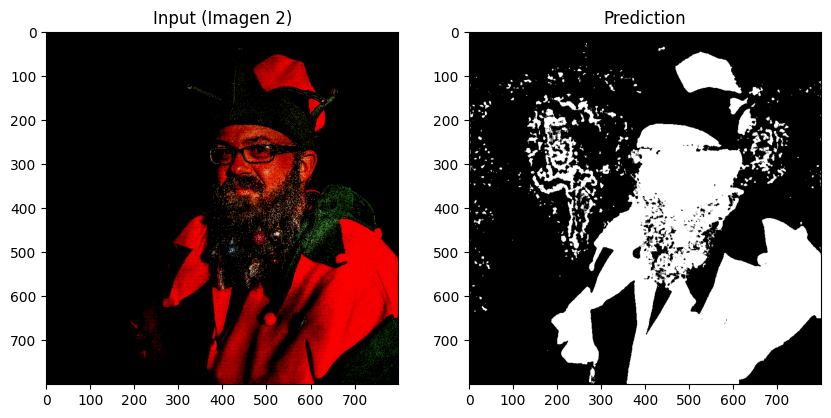

In [20]:
evaluate_and_show_test(model, test_loader, DEVICE, index=2)

## Combined loss

Ya que me evaluan con dice loss pruebo utilizar una combinacion de BCE y dice como loss

Ademas, subo un poco el LR para acelerar el entrenamiento

In [25]:
class CombinedLoss(nn.Module):
    def __init__(self, bce_weight=0.5, dice_weight=0.5):
        super(CombinedLoss, self).__init__()
        self.bce = nn.BCELoss()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

    def forward(self, preds, targets):
        bce_loss = self.bce(preds, targets)
        dice_loss = dice_loss_fn(preds, targets)
        total_loss = self.bce_weight * bce_loss + self.dice_weight * dice_loss
        return total_loss

In [41]:
combined_loss = CombinedLoss(bce_weight=0.5, dice_weight=0.5)

In [27]:
model = UNetDropout(in_channels=3, out_channels=1, dropout_prob=0.3).to(DEVICE)

In [29]:
optimizer = optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-4)

In [28]:
model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v3_lr.pth"))

/tmp/ipykernel_30/2723276304.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v3_lr.pth"))


<All keys matched successfully>

In [31]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=combined_loss, 
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=5,
    patience=3,
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_v4_combined_loss.pth"
)

Epoch 1/5, Train Loss: 0.50809353, Val Loss: 0.49459898
Pesos guardados en /kaggle/working/unet_v4_combined_loss.pth con val_loss de 0.49459898
Epoch 2/5, Train Loss: 0.50977816, Val Loss: 0.49353407
Pesos guardados en /kaggle/working/unet_v4_combined_loss.pth con val_loss de 0.49353407
Epoch 3/5, Train Loss: 0.50677072, Val Loss: 0.48971492
Pesos guardados en /kaggle/working/unet_v4_combined_loss.pth con val_loss de 0.48971492


KeyboardInterrupt: 

In [33]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_v5_combined_loss.csv")

Archivo de predicciones guardado como /kaggle/working/submission_v5_combined_loss.csv


Con solo 3 epocas mejoro hasta 0.646 en kaggle

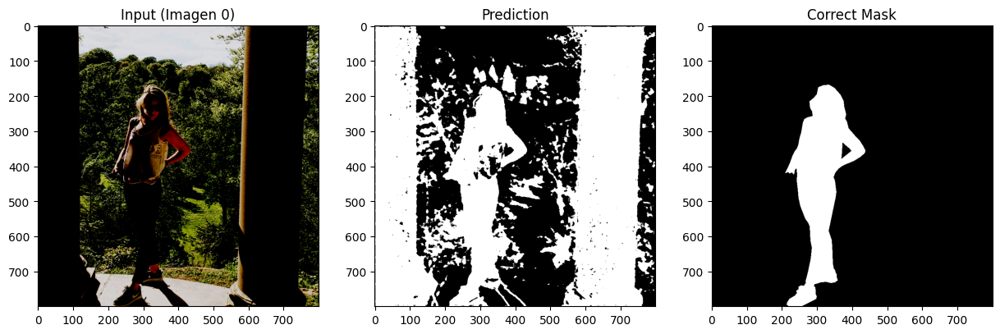

In [43]:
show_val_predictions(model, val_loader, DEVICE, index=0)

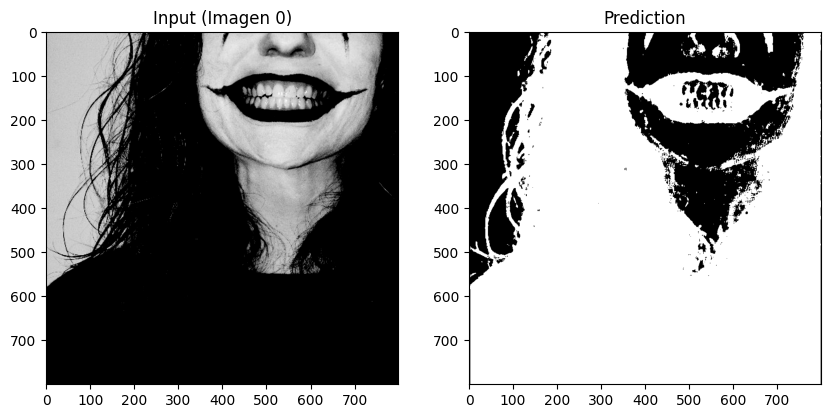

In [34]:
evaluate_and_show_test(model, test_loader, DEVICE, index=0)

Peores 3 predicciones:


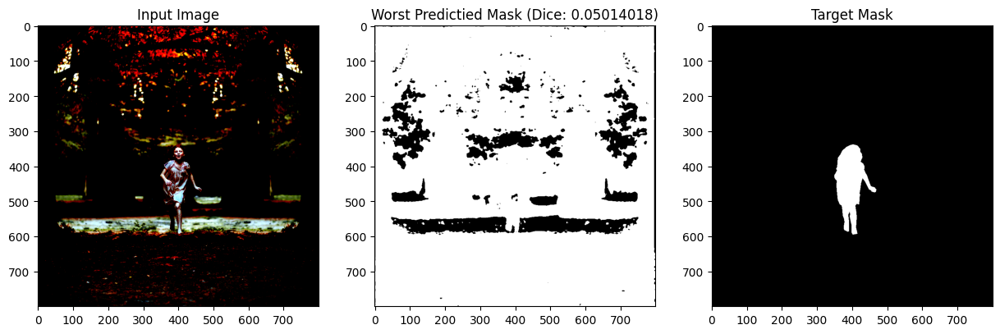

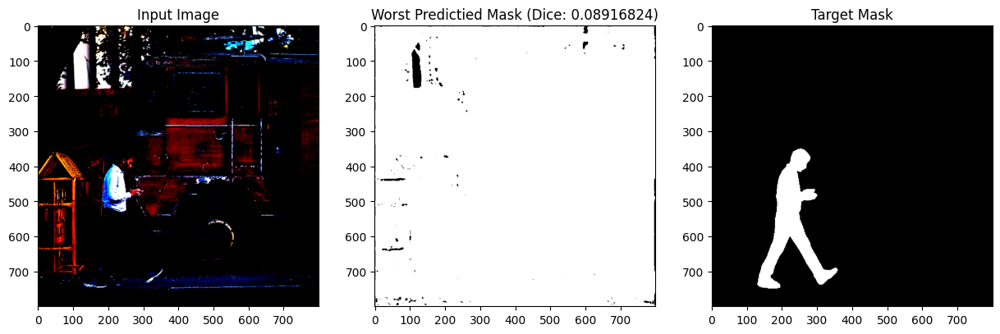

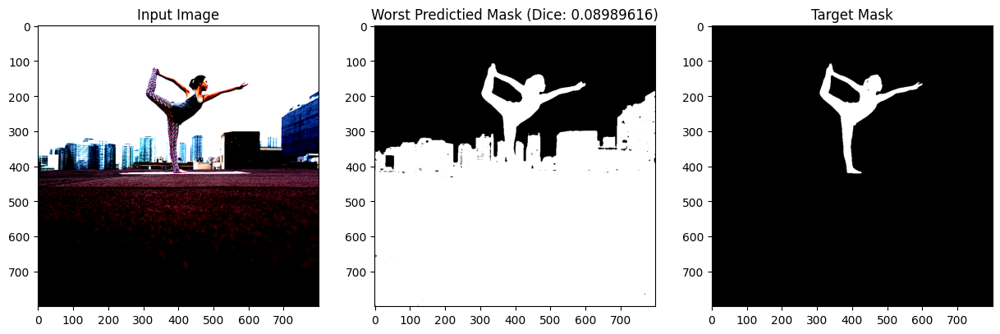

Mejores 3 predicciones:


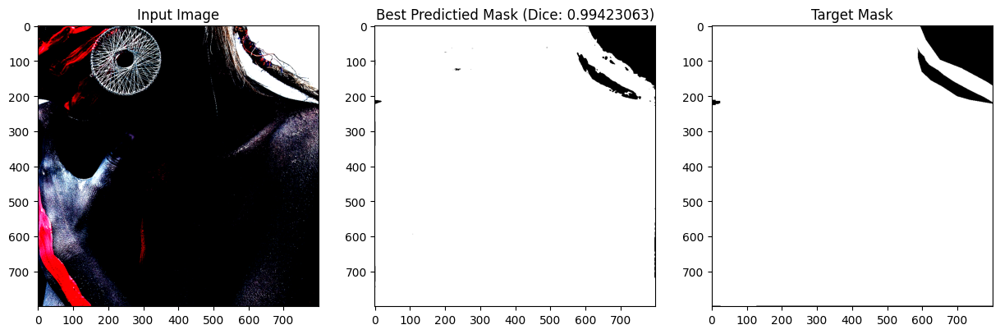

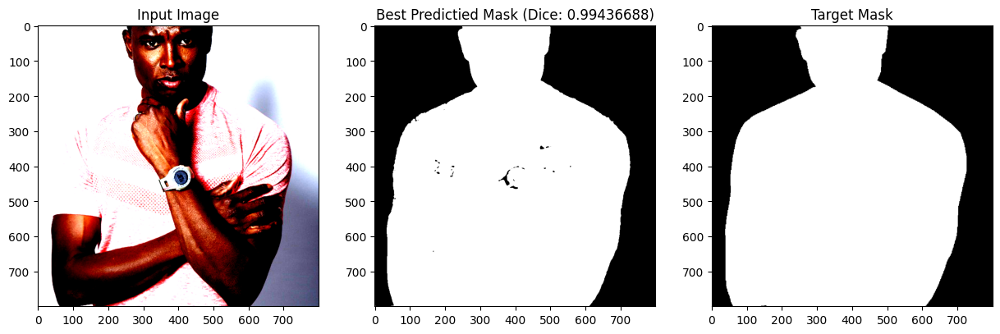

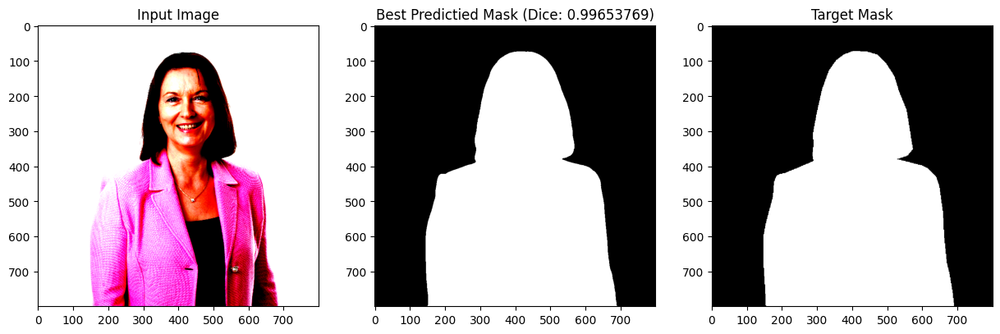

Promedio de Dice en el conjunto de validación: 0.64431812


In [46]:
dice_score = find_best_and_worst_predictions(model, val_loader, DEVICE, num_images=3)

## Mas epocas 

In [26]:
combined_loss = CombinedLoss(bce_weight=0.5, dice_weight=0.5)
model = UNetDropout(in_channels=3, out_channels=1, dropout_prob=0.3).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-4)

In [27]:
model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v3_lr.pth"))

/tmp/ipykernel_30/2723276304.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v3_lr.pth"))


<All keys matched successfully>

Peores 3 predicciones:


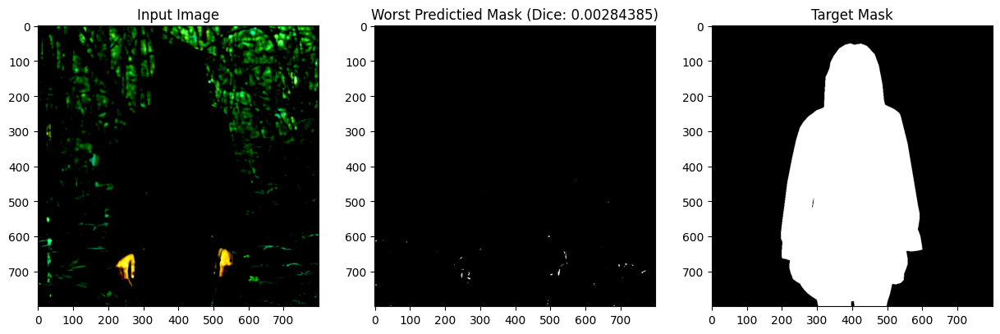

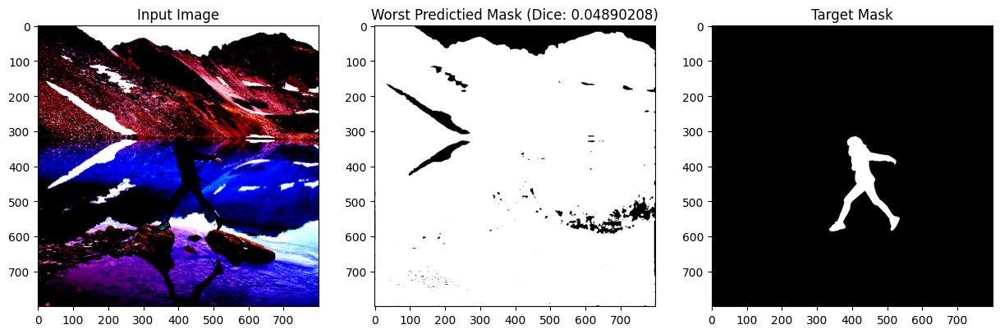

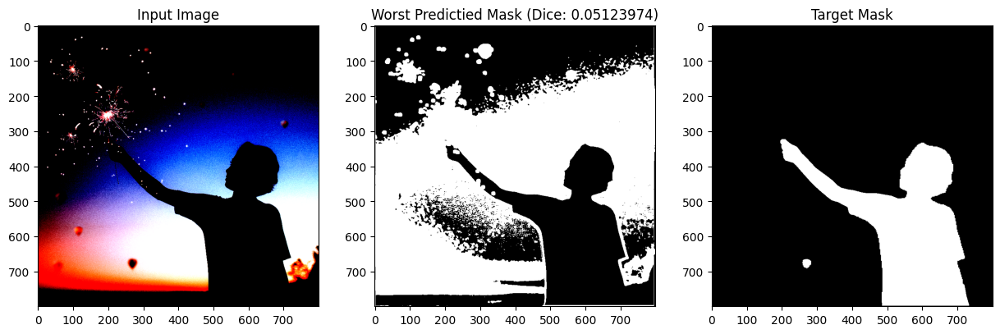

Mejores 3 predicciones:


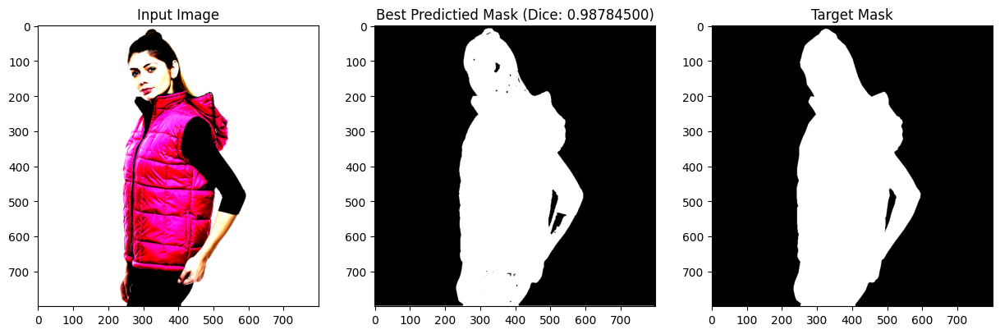

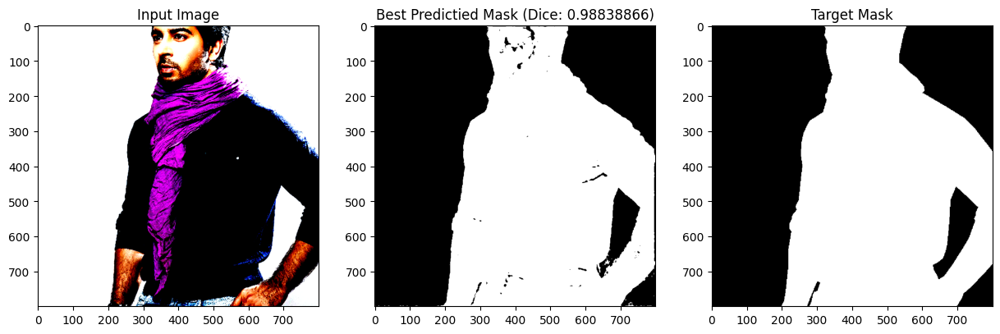

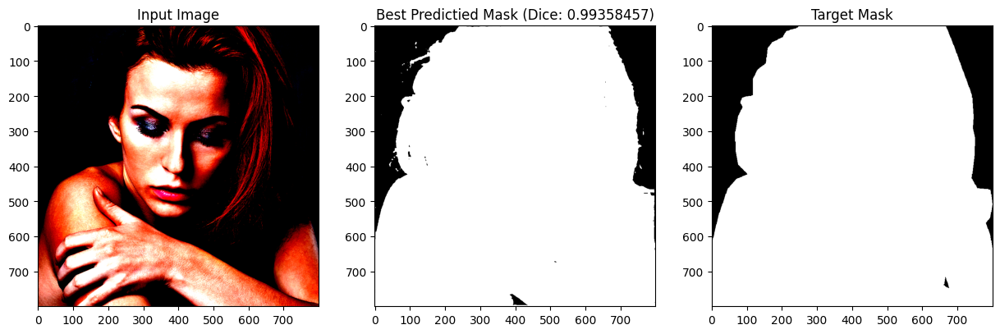

Promedio de Dice en el conjunto de validación: 0.60575303


In [28]:
dice_score = find_best_and_worst_predictions(model, val_loader, DEVICE, num_images=3)

In [29]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=combined_loss, 
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=10,
    patience=5,
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_v5_combined_loss_more_epoch.pth"
)
#prev_best_val_loss=0.48971492
#Empezo 17:26 + 3 horas 20

Epoch 1/10, Train Loss: 0.50744502, Val Loss: 0.52034860
Pesos guardados en /kaggle/working/unet_v5_combined_loss_more_epoch.pth con val_loss de 0.52034860
Epoch 2/10, Train Loss: 0.50187355, Val Loss: 0.52543471
Epoch 3/10, Train Loss: 0.50278100, Val Loss: 0.51945718
Pesos guardados en /kaggle/working/unet_v5_combined_loss_more_epoch.pth con val_loss de 0.51945718
Epoch 4/10, Train Loss: 0.50322610, Val Loss: 0.51619311
Pesos guardados en /kaggle/working/unet_v5_combined_loss_more_epoch.pth con val_loss de 0.51619311
Epoch 5/10, Train Loss: 0.50057979, Val Loss: 0.51715701
Epoch 6/10, Train Loss: 0.50081491, Val Loss: 0.51412945
Pesos guardados en /kaggle/working/unet_v5_combined_loss_more_epoch.pth con val_loss de 0.51412945
Epoch 7/10, Train Loss: 0.50120863, Val Loss: 0.51478961
Epoch 8/10, Train Loss: 0.50009181, Val Loss: 0.52550294
Epoch 9/10, Train Loss: 0.50022382, Val Loss: 0.53299148
Epoch 10/10, Train Loss: 0.50078809, Val Loss: 0.54080322
El entrenamiento completo demoró 

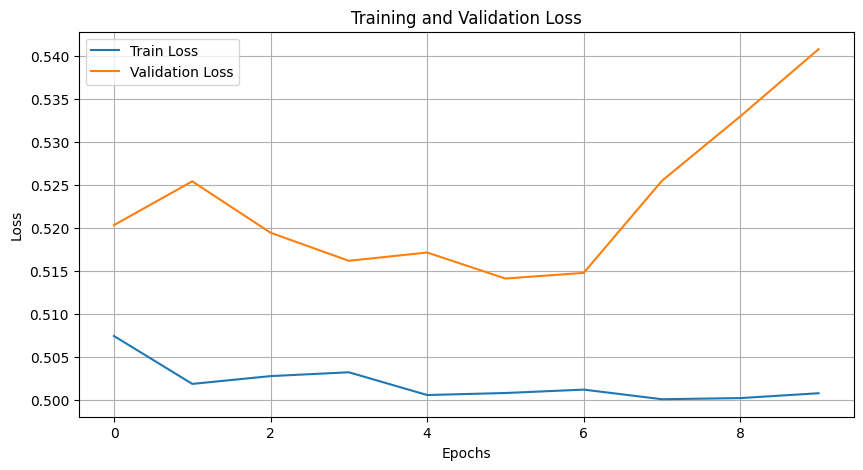

In [37]:
plot_taining(train_losses, val_losses)

In [30]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_v6_combined_loss_more_epoch.csv")

Archivo de predicciones guardado como /kaggle/working/submission_v6_combined_loss_more_epoch.csv


0.639 kaggle

Peores 3 predicciones:


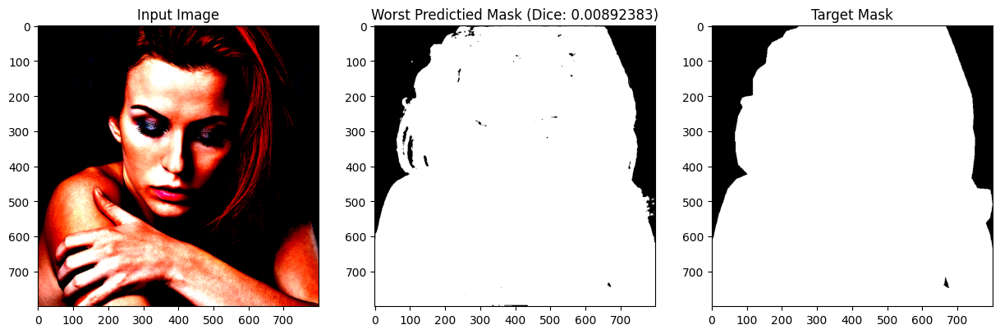

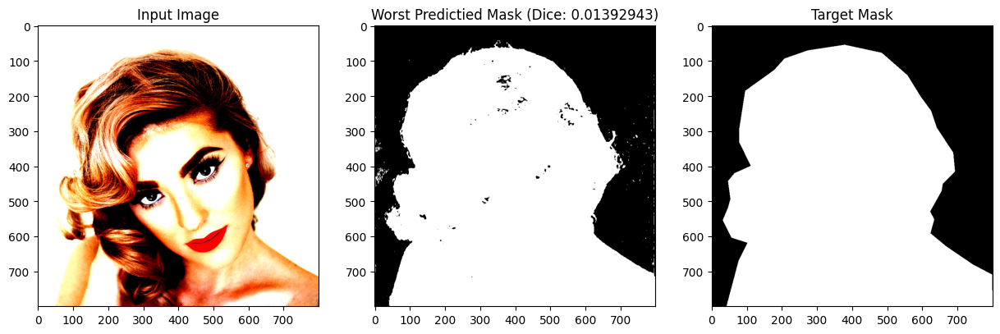

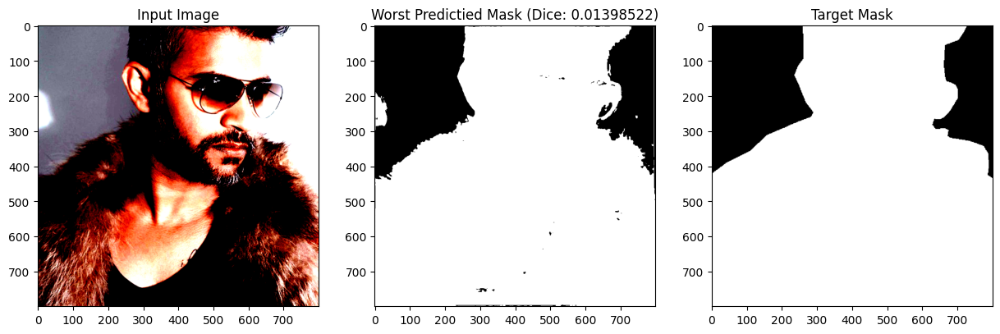

Mejores 3 predicciones:


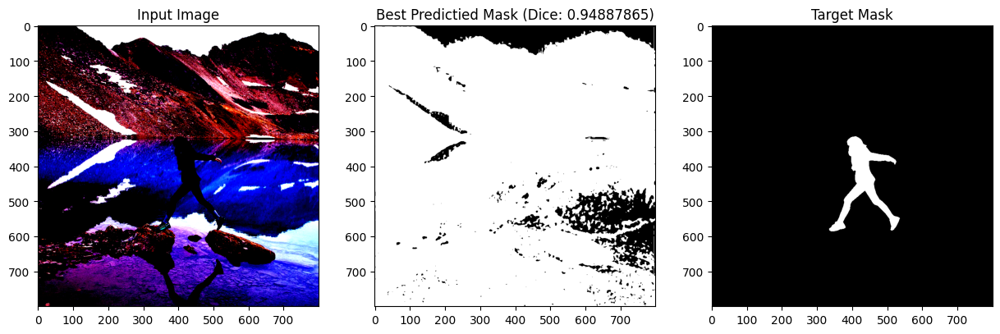

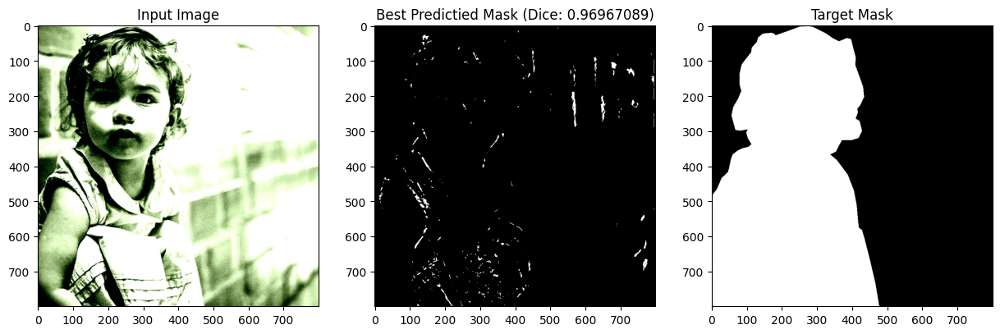

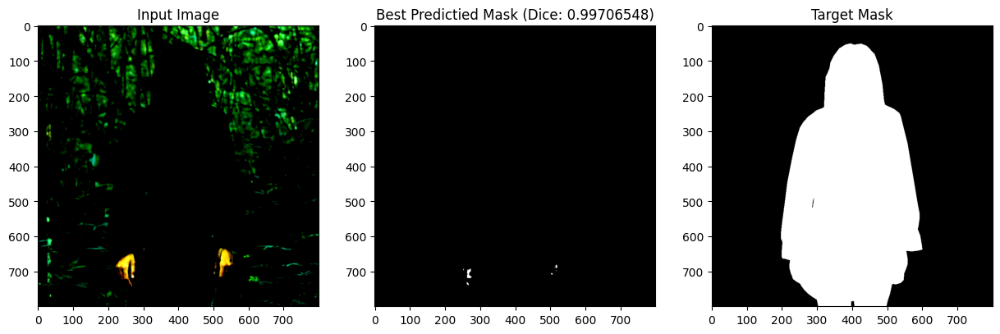

Promedio de Dice en el conjunto de validación: 0.38195789


In [34]:
dice_score = find_best_and_worst_predictions(model, val_loader, DEVICE, num_images=3)

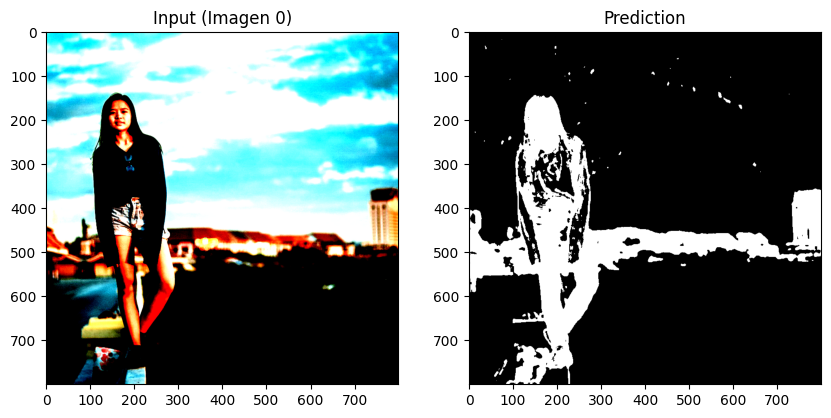

In [35]:
evaluate_and_show_test(model, test_loader, DEVICE, index=0)

In [36]:
combined_loss = CombinedLoss(bce_weight=0.5, dice_weight=0.5)
model = UNetDropout(in_channels=3, out_channels=1, dropout_prob=0.3).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-4)
model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v4_combined_loss.pth"))

/tmp/ipykernel_30/2967159910.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{base_path_kaggle}unet_v4_combined_loss.pth"))


<All keys matched successfully>

In [38]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=combined_loss, 
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=6,
    patience=4,
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_v6.pth"
)
#0.51412945

Epoch 1/6, Train Loss: 0.50630835, Val Loss: 0.51666624
Pesos guardados en /kaggle/working/unet_v6.pth con val_loss de 0.51666624
Epoch 2/6, Train Loss: 0.50163062, Val Loss: 0.51492078
Pesos guardados en /kaggle/working/unet_v6.pth con val_loss de 0.51492078
Epoch 3/6, Train Loss: 0.49939518, Val Loss: 0.51806346
Epoch 4/6, Train Loss: 0.50100154, Val Loss: 0.51493662
Epoch 5/6, Train Loss: 0.50184699, Val Loss: 0.52139438
Epoch 6/6, Train Loss: 0.49947060, Val Loss: 0.51925602
Early stopping en la época 6. Mejor val_loss: 0.51492078
El entrenamiento completo demoró 1.65 horas.


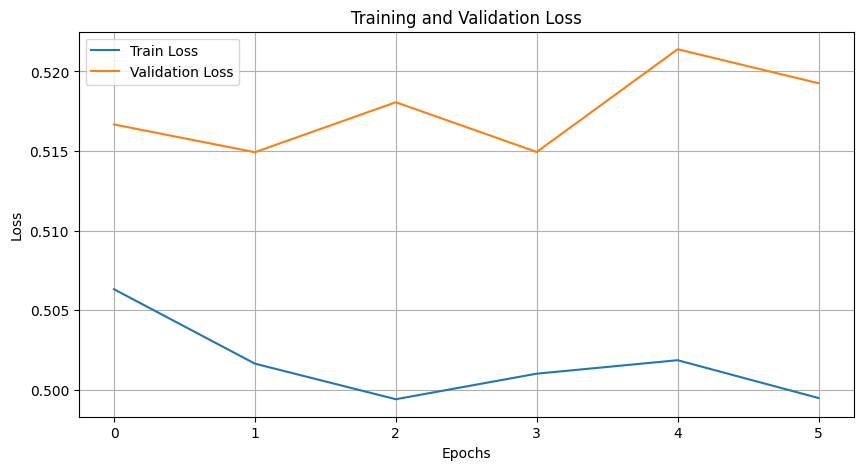

In [39]:
plot_taining(train_losses, val_losses)

In [40]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_v6.csv")

Archivo de predicciones guardado como /kaggle/working/submission_v6.csv


0.640 en kaggle

Peores 3 predicciones:


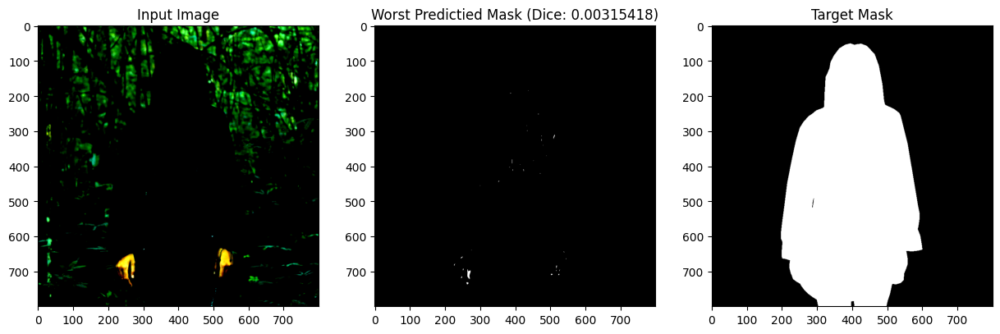

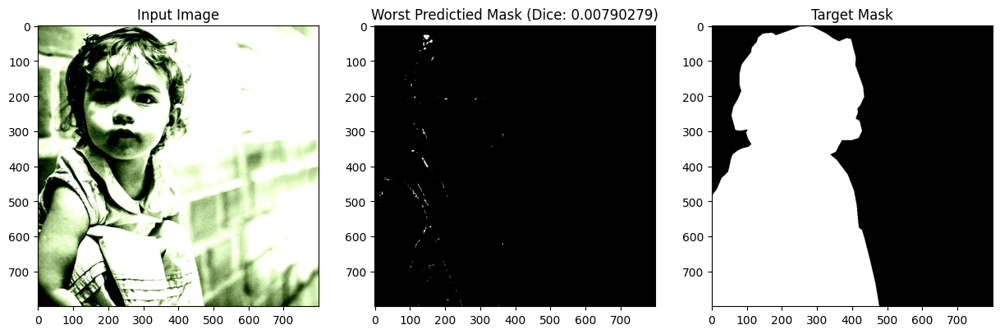

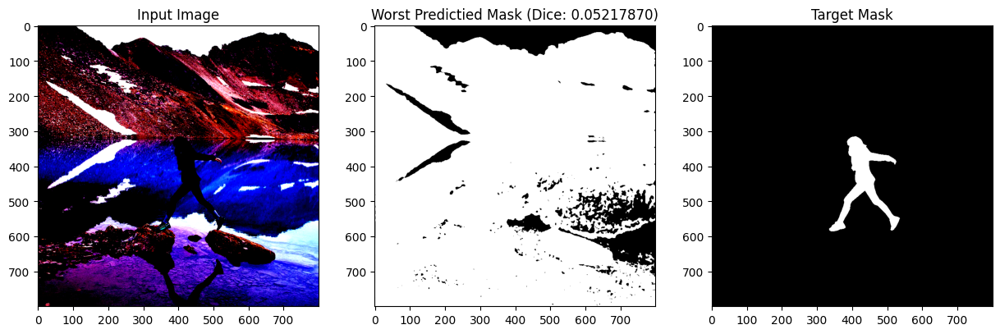

Mejores 3 predicciones:


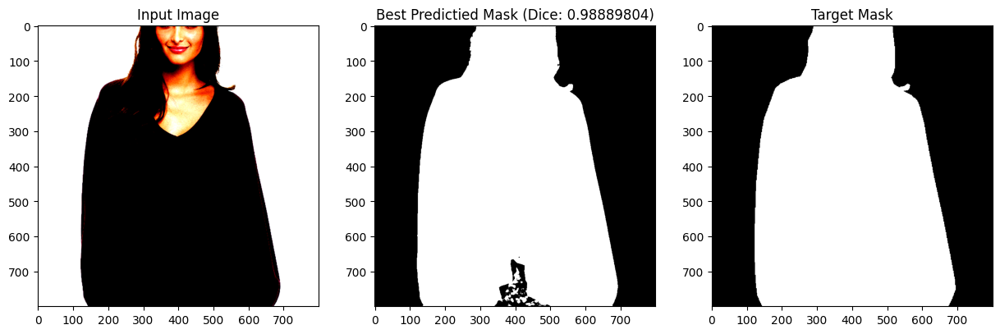

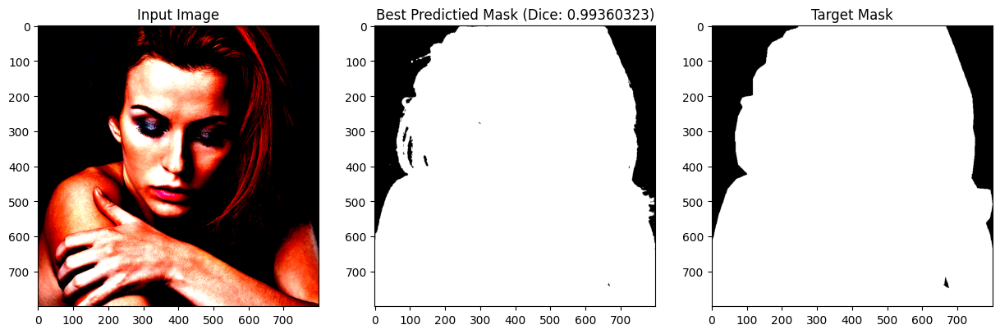

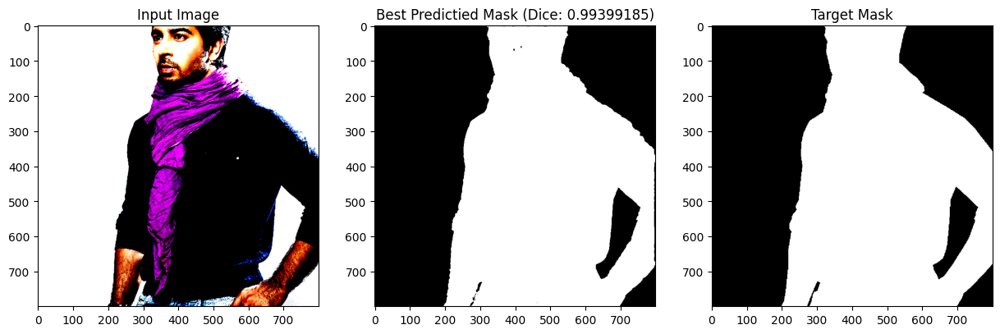

Promedio de Dice en el conjunto de validación: 0.62517480


In [51]:
dice_score = find_best_and_worst_predictions(model, val_loader, DEVICE, num_images=3)

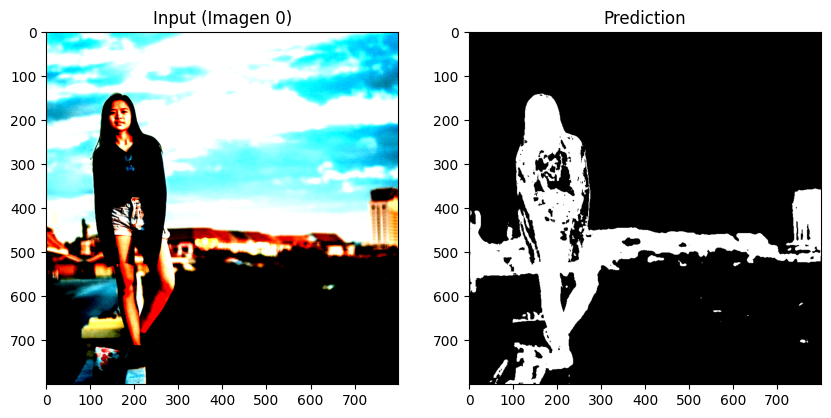

In [42]:
evaluate_and_show_test(model, test_loader, DEVICE, index=0)

## Dropout2d + init weights + loss_weights_adjusted

Estoy usando dropout pero despues lei que hay un dropout2d que es mas recomendable al trabajar con covoluciones ya que apaga un canal entero.

Ademas, dado que la letra habla de inicializacion de pesos me puse a investigar y encontre que para redes que utilizan funciones ReLu es recomendable la inicialización He. Esta inicialización asigna los pesos de manera que las salidas de cada capa convolucional mantengan una varianza apropiada para evitar vanishing y/o exploding gradients.

Por otro lado, mi primer entrenamiento fue solo con la dice loss. Este no aprendia absolutamente nada, las loss tanto de train como de val quedaban igual. Cuando cambie a BCE empezo a aprender pero llego un momento que dejo de aprender tanto hasta que cambie a la CombinedLoss con 0.5 y 0.5 de peso a cada una y mejoro rapidamente. Por lo tanto, voy a utilizar la combined loss desde la primer epoca ajustando los pesos a medida que pasan las epocas. Disminuyendo la BCE y amunentando la dice.

Ademas, cree la funcion find_best_and_worst_predictions para mostrar las mejores y peores predicciones segun DICE.

In [24]:
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)

In [25]:
class UNetDropout2d(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, dropout_prob=0.5):
        super(UNetDropout2d, self).__init__()
        self.dropout_prob = dropout_prob
        
        self.encoder1 = self._block(in_channels, 64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = self._block(64, 128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = self._block(128, 256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = self._block(256, 512)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = self._block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = self._block(1024, 512)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = self._block(512, 256)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = self._block(256, 128)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = self._block(128, 64)

        self.conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def _block(self, in_channels, features):
        return nn.Sequential(
            nn.Conv2d(in_channels, features, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout2d(self.dropout_prob),
            nn.Conv2d(features, features, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout2d(self.dropout_prob)
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)

        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)

        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)

        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)

        return torch.sigmoid(self.conv(dec1))

In [24]:
model = UNetDropout2d(in_channels=3, out_channels=1, dropout_prob=0.3).to(DEVICE)
model.apply(init_weights)
optimizer = optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-4)

In [ ]:
class CombinedLossWeightsAdjusted(nn.Module):
    def __init__(self, bce_weight=0.5, dice_weight=0.5):
        super(CombinedLossWeightsAdjusted, self).__init__()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.bce_loss = nn.BCELoss()

    def forward(self, preds, targets):
        bce = self.bce_loss(preds, targets)
        dice = dice_loss_fn(preds, targets)
        return self.bce_weight * bce + self.dice_weight * dice
    
    def update_weights(self, bce_weight, dice_weight):
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

In [79]:
combined_loss = CombinedLossWeightsAdjusted(bce_weight=0.75, dice_weight=0.25)

In [82]:
#Bajo gradualmente los pesos. 
def gradual_loss_weights(prev_bce_weight, decay_rate=0.025, min_bce_weight=0.1):
    bce_weight = max(min_bce_weight, prev_bce_weight - decay_rate)
    dice_weight = 1 - bce_weight
    return bce_weight, dice_weight

In [83]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=combined_loss, 
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=10,
    patience=4,
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_dropout2d_v1.pth",
    prev_bce_weight=0.75,
    adjust_loss_weights_fn=gradual_loss_weights
)
#empezo 11:31

Epoch 1/10, Train Loss: 0.63488177, Val Loss: 0.58621459
Pesos de la pérdida (BCE: 0.7250, Dice: 0.2750)
Pesos guardados en /kaggle/working/unet_dropout2d_v1.pth con val_loss de 0.58621459
Epoch 2/10, Train Loss: 0.59779140, Val Loss: 0.57648515
Pesos de la pérdida (BCE: 0.7000, Dice: 0.3000)
Pesos guardados en /kaggle/working/unet_dropout2d_v1.pth con val_loss de 0.57648515
Epoch 3/10, Train Loss: 0.59271826, Val Loss: 0.58140709
Pesos de la pérdida (BCE: 0.6750, Dice: 0.3250)
Epoch 4/10, Train Loss: 0.70535761, Val Loss: 0.65253120
Pesos de la pérdida (BCE: 0.6500, Dice: 0.3500)
Epoch 5/10, Train Loss: 0.65553485, Val Loss: 0.64993219
Pesos de la pérdida (BCE: 0.6250, Dice: 0.3750)
Epoch 6/10, Train Loss: 0.65745300, Val Loss: 0.64776044
Pesos de la pérdida (BCE: 0.6000, Dice: 0.4000)
Early stopping en la época 6. Mejor val_loss: 0.57648515
El entrenamiento completo demoró 1.84 horas.


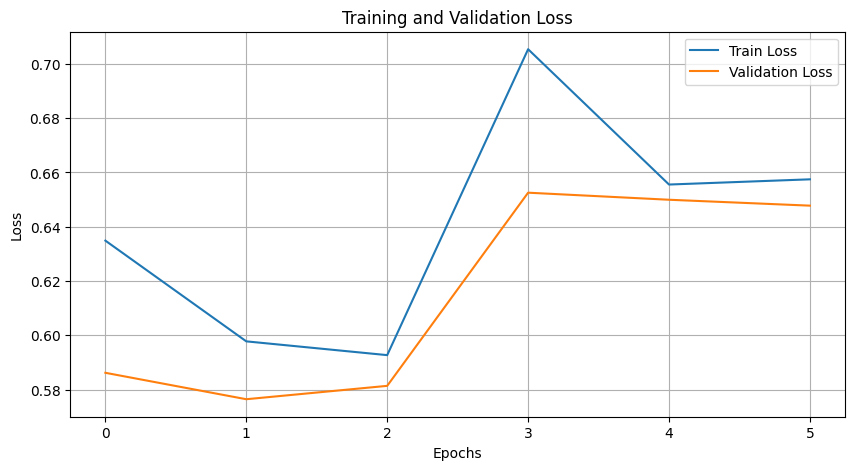

In [84]:
plot_taining(train_losses, val_losses)

In [85]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_dropout2d_v1.csv")

Archivo de predicciones guardado como /kaggle/working/submission_dropout2d_v1.csv


Peores 3 predicciones:


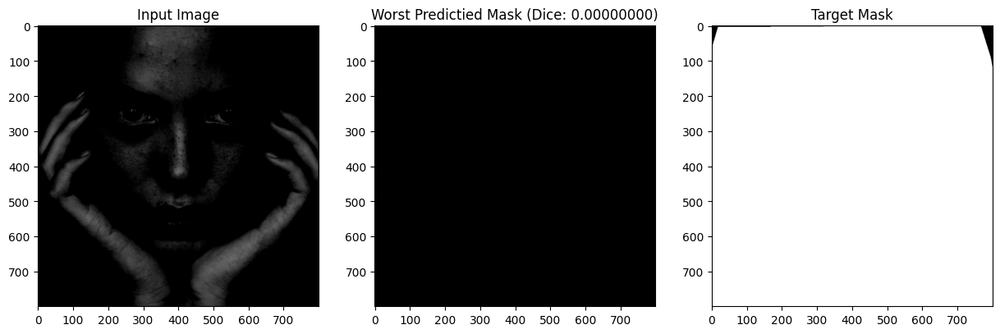

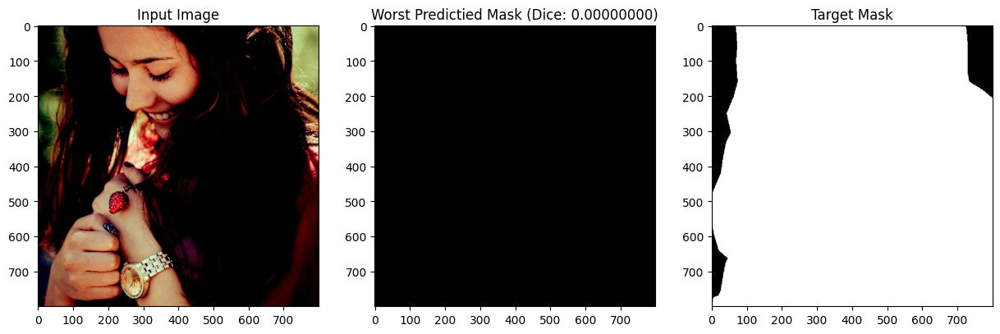

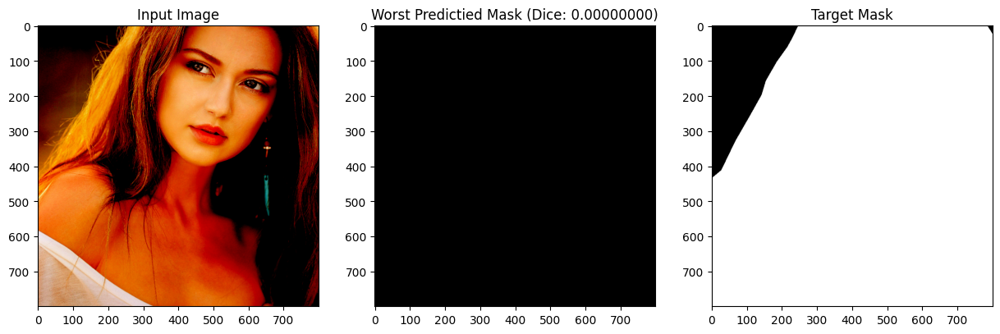

Mejores 3 predicciones:


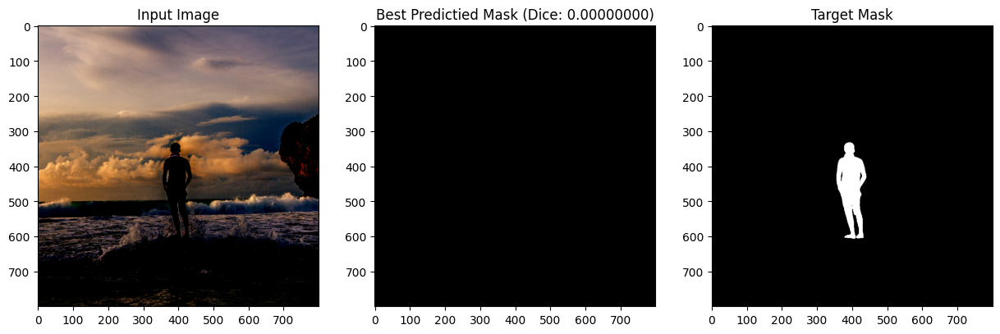

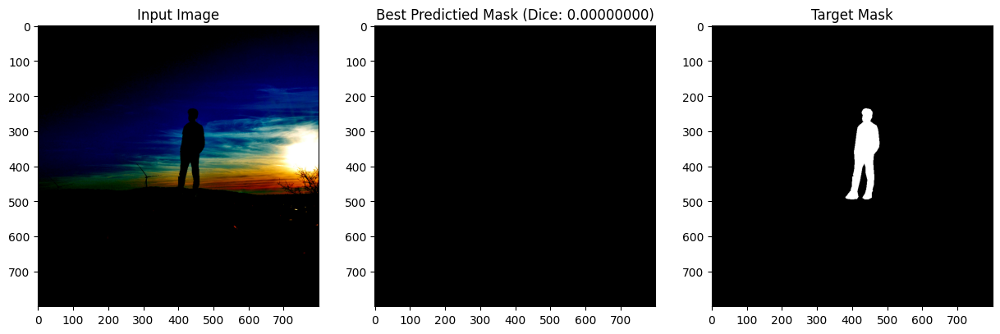

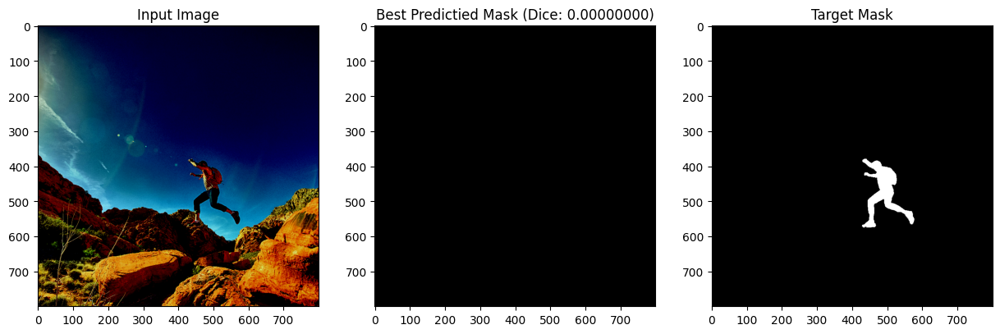

Promedio de Dice en el conjunto de validación: 0.00000000


In [86]:
dice_score = find_best_and_worst_predictions(model, val_loader, DEVICE, num_images=3)

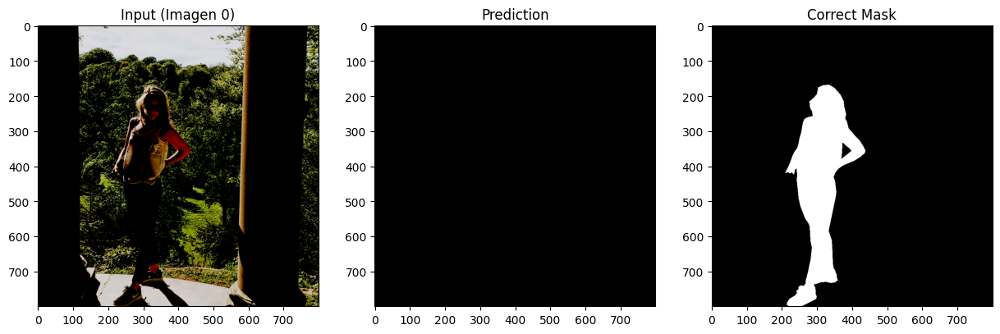

In [87]:
show_val_predictions(model, val_loader, DEVICE, index=0)

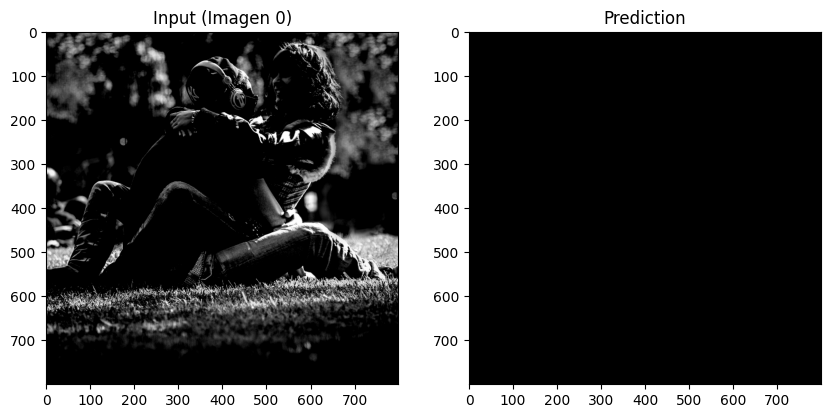

In [88]:
evaluate_and_show_test(model, test_loader, DEVICE, index=0)

No aprendio nada. 

Vamos a dividir el entrenamiento con distintas estrategias. Creo que al principio puede ser beneficioso tenerun LR mayor para acelerar el entrenamiento y que aprenda solo con la BCE. Luego si bajar LR y que la dice tenga participacion.

In [29]:
#Bajo gradualmente los pesos. 
combined_loss = CombinedLossWeightsAdjusted(bce_weight=1, dice_weight=0)
def gradual_loss_weights(prev_bce_weight, decay_rate=0, min_bce_weight=1):
    bce_weight = max(min_bce_weight, prev_bce_weight - decay_rate)
    dice_weight = 1 - bce_weight
    return bce_weight, dice_weight

model = UNetDropout2d(in_channels=3, out_channels=1, dropout_prob=0.4).to(DEVICE) 
model.apply(init_weights)

optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)

In [34]:
train_losses, val_losses = train(
    model=model,
    optimizer=optimizer,
    criterion=combined_loss, 
    train_loader=train_loader,
    val_loader=val_loader,
    device=DEVICE,
    epochs=10,
    patience=5,
    log_every=1,
    save_weights=True,
    save_path=f"{base_path_kaggle}unet_dropout2d_v2.pth",
    prev_bce_weight=1,
    adjust_loss_weights_fn=gradual_loss_weights
)
#empezo 10:12
#0.57648515
#0.54218368

Epoch 1/10, Train Loss: 0.70312109, Val Loss: 0.67769856
Pesos de la pérdida (BCE: 1.0000, Dice: 0.0000)
Pesos guardados en /kaggle/working/unet_dropout2d_v2.pth con val_loss de 0.67769856
Epoch 2/10, Train Loss: 0.76215532, Val Loss: 0.67820652
Pesos de la pérdida (BCE: 1.0000, Dice: 0.0000)
Epoch 3/10, Train Loss: 0.68444399, Val Loss: 0.67807998
Pesos de la pérdida (BCE: 1.0000, Dice: 0.0000)


KeyboardInterrupt: 

In [ ]:
plot_taining(train_losses, val_losses)

In [ ]:
generate_kaggle_submission(model, test_loader, test_dataset, DEVICE,output_file=f"{base_path_kaggle}submission_dropout2d_v1.csv")

In [ ]:
dice_score = find_best_and_worst_predictions(model, val_loader, DEVICE, num_images=3)

In [ ]:
evaluate_and_show_test(model, test_loader, DEVICE, index=0)


# Requisitos Universitarios

Fecha de entrega: 10/12/2024 hasta las 21:00 horas en gestion.ort.edu.uy (max. 40Mb en formato zip)

### Uso de material de apoyo y/o consulta

Inteligencia Artificial Generativa:

   - Seguir las pautas de los docentes: Se deben seguir las instrucciones específicas de los docentes sobre cómo utilizar la IA en cada curso.
   - Citar correctamente las fuentes y usos de IA: Siempre que se utilice una herramienta de IA para generar contenido, se debe citar adecuadamente la fuente y la forma en que se utilizó.
   - Verificar el contenido generado por la IA: No todo el contenido generado por la IA es correcto o preciso. Es esencial que los estudiantes verifiquen la información antes de usarla.
   - Ser responsables con el uso de la IA: Conocer los riesgos y desafíos, como la creación de “alucinaciones”, los peligros para la privacidad, las cuestiones de propiedad intelectual, los sesgos inherentes y la producción de contenido falso.
   - En caso de existir dudas sobre la autoría, plagio o uso no atribuido de IAG, el docente tendrá la opción de convocar al equipo de obligatorio a una defensa específica e individual sobre el tema.

### Defensa

Fecha de defensa: 11/12/2024

La defensa es obligatoria y eliminatoria. El docente es quien definirá y comunicará la modalidad, y mecánica de defensa. La no presentación a la misma implica la pérdida de la totalidad de los puntos del Obligatorio.

IMPORTANTE:

   1) Inscribirse
   2) Formar grupos de hasta 2 personas del mismo dictado
   3) Subir el trabajo a Gestión antes de la hora indicada (ver hoja al final del documento: “RECORDATORIO”)

Aquellos de ustedes que presenten alguna dificultad con su inscripción o tengan inconvenientes técnicos, por favor contactarse con el Coordinador de cursos o Coordinación adjunta antes de las 20:00h del día de la entrega, a través de los mails crosa@ort.edu.uy / posada_l@ort.edu.uy (matutino) / larrosa@ort.edu.uy (nocturno), o vía Ms Teams.